In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import sklearn.metrics as skm
import sklearn.model_selection as skms
import sklearn.preprocessing as skp
import scipy
import sys
from scipy.io import wavfile as wav
import librosa as lr
import librosa.display
from glob import glob
import IPython
from IPython.display import Audio
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow import keras
import csv
import sklearn.model_selection as skms
import sklearn.preprocessing as skp
import logging
from tensorflow.keras import layers 
from tensorflow.keras.preprocessing import timeseries_dataset_from_array
import keras as k
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D,Dropout,Activation
from sklearn.model_selection import train_test_split
import os
from keras.optimizers import Adam
import seaborn as sns
from scipy.stats import uniform, randint
from sklearn import preprocessing

2022-08-11 12:44:26.630428: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-08-11 12:44:26.630461: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
# before writing to csv, try feature extraction from just one audio first
audio_recording = 'Top_50_songs/Data/genres_original/blues/blues.000001.wav'
data, sr = librosa.load(audio_recording)

# chroma
chroma = librosa.feature.chroma_stft(data, sr=sr)
chroma_stft_mean= chroma.mean()
print("chroma_mean: "+ str(chroma_stft_mean))
chroma_stft_var= chroma.var()
print("chroma_var: "+ str(chroma_stft_var))

# root mean square
rms = librosa.feature.rms(data)
rms_mean = rms.mean()
print("rms_mean: "+ str(rms_mean))
rms_var = rms.var()
print("rms_var: "+ str(rms_var))

# spectral centroid
spectral_centroid = librosa.feature.spectral_centroid(data, sr=sr)
spectral_centroid_mean = spectral_centroid.mean()
print("spectral_centroid_mean: "+ str(spectral_centroid_mean))
spectral_centroid_var = spectral_centroid.var()
print("spectral_centroid_var: "+ str(spectral_centroid_var))

# spectral bandwidth
spectral_bandwidth = librosa.feature.spectral_bandwidth(data, sr=sr)
spectral_bandwidth_mean = spectral_bandwidth.mean()
print("spectral_bandwidth_mean: "+ str(spectral_bandwidth_mean))
spectral_bandwidth_var = spectral_bandwidth.var()
print("spectral_bandwidth_var: "+ str(spectral_bandwidth_var))

# spectral rolloff
rolloff = librosa.feature.spectral_rolloff(data, sr=sr)
rolloff_mean = rolloff.mean()
print("rolloff_mean: "+ str(rolloff_mean))
rolloff_var = rolloff.var()
print("rolloff_var: "+ str(rolloff_var))

#zero crossing rate
zero_crossing_rate = librosa.feature.zero_crossing_rate(data)
zero_crossing_rate_mean = zero_crossing_rate.mean()
print("zero_crossing_rate_mean: "+ str(zero_crossing_rate_mean))
zero_crossing_rate_var = zero_crossing_rate.var()
print("zero_crossing_rate_var: "+ str(zero_crossing_rate_var))

#harmony and perceptrual
harmony, perceptrual = librosa.effects.hpss(data)

harmony_mean = harmony.mean()
print("harmony_mean: "+ str(harmony_mean))
harmony_var = harmony.var()
print("harmony_var: "+ str(harmony_var))

perceptrual_mean = perceptrual.mean()
print("perceptrual_mean: "+ str(perceptrual_mean))
perceptrual_var = perceptrual.var()
print("perceptrual_var: "+ str(perceptrual_var))

mfccs = librosa.feature.mfcc(data, sr=sr)
mfcc_count = 1
for mfcc in mfccs:
    print('mfcc'+ str(mfcc_count)+ ': '+str(np.mean(mfcc)))
    mfcc_count=mfcc_count+1

#tempo
tempo, beats = librosa.beat.beat_track(data)
print("tempo: "+ str(tempo))

/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[0.         0.         0.         ... 0.17679746 0.16013686 0.16695875] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


chroma_mean: 0.32606345
chroma_var: 0.10275622
rms_mean: 0.14831777
rms_var: 0.0311663
spectral_centroid_mean: 1207.054377257243
spectral_centroid_var: 645947.1489127064


/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: Pass y=[0.         0.         0.         ... 0.17679746 0.16013686 0.16695875] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  del sys.path[0]
/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:20: FutureWarning: Pass y=[0.         0.         0.         ... 0.17679746 0.16013686 0.16695875] as keyword args. From version 0.10 passing these as positional arguments will result in an error
/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:27: FutureWarning: Pass y=[0.         0.         0.         ... 0.17679746 0.16013686 0.16695875] as keyword args. From version 0.10 passing these as positional arguments will result in an error


spectral_bandwidth_mean: 1481.5553882167637
spectral_bandwidth_var: 709502.3987258426
rolloff_mean: 2429.4936425176566
rolloff_var: 4693440.229410362
zero_crossing_rate_mean: 0.04650538772252322
zero_crossing_rate_var: 0.0008401788955329929


/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:34: FutureWarning: Pass y=[0.         0.         0.         ... 0.17679746 0.16013686 0.16695875] as keyword args. From version 0.10 passing these as positional arguments will result in an error


harmony_mean: 6.94207e-06
harmony_var: 0.033565324
perceptrual_mean: -7.090115e-05
perceptrual_var: 0.010471052
mfcc1: -273.54
mfcc2: 112.07709
mfcc3: 23.115595
mfcc4: 5.317363
mfcc5: 3.9245813
mfcc6: 1.9229816
mfcc7: -12.091301
mfcc8: -2.5759418
mfcc9: -12.006343
mfcc10: -5.720114
mfcc11: -6.824872
mfcc12: -3.57741
mfcc13: -7.501622
mfcc14: -5.9130826
mfcc15: -4.03238
mfcc16: -2.1237032
mfcc17: -3.5250225
mfcc18: -1.8745283
mfcc19: -7.966536
mfcc20: -4.0286064


/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:60: FutureWarning: Pass y=[0.         0.         0.         ... 0.17679746 0.16013686 0.16695875] as keyword args. From version 0.10 passing these as positional arguments will result in an error
/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:67: FutureWarning: Pass y=[0.         0.         0.         ... 0.17679746 0.16013686 0.16695875] as keyword args. From version 0.10 passing these as positional arguments will result in an error


tempo: 107.666015625


In [3]:
librosa.load(audio_recording, sr=45600)

(array([0.        , 0.        , 0.        , ..., 0.15287775, 0.16428855,
        0.15659305], dtype=float32),
 45600)

In [4]:
IPython.display.Audio(data, rate=sr)

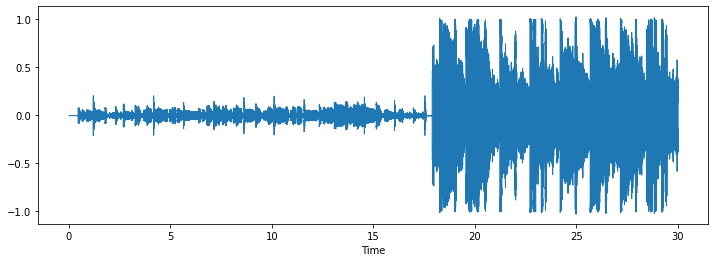

In [5]:
plt.figure(figsize=(12,4))
librosa.display.waveshow(data)
plt.show()

/home/zgohar/.local/lib/python3.7/site-packages/librosa/util/decorators.py:88: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  return f(*args, **kwargs)


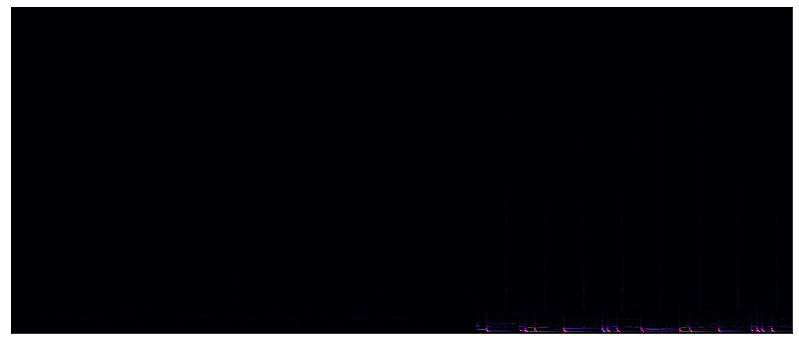

In [6]:
# create spectrogram of song
stft = librosa.stft(data)
stft_db = librosa.amplitude_to_db(abs(stft))
plt.figure(figsize=(14,6))
librosa.display.specshow(stft)

In [7]:
def trim_wav( originalWavPath, newWavPath , start, end ):
    '''
    :param originalWavPath: the path to the source wav file
    :param newWavPath: output wav file * can be same path as original
    :param start: time in seconds
    :param end: time in seconds
    :return:
    '''
    sampleRate, waveData = wav.read( originalWavPath )
    startSample = int( start * sampleRate )
    endSample = int( end * sampleRate )
    wav.write( newWavPath, sampleRate, waveData[startSample:endSample])
    
# grab music from an input directory containing .wav files
input_dir_path = 'Top_50_songs/input_dir/'
output_audio_path = 'Top_50_songs/output_audio_dir/'
output_images_path = 'Top_50_songs/output_images_dir/'

for file in os.listdir(input_dir_path):
    # trim not at the beginning, but 15 secs in the middle of the song
    trim_wav(input_dir_path+file, output_audio_path+file, 15, 45)
    # create spectrogram of song and save to output_images_dir
    data, sr = librosa.load(output_audio_path+file)
    stft = librosa.stft(data)
    stft_db = librosa.amplitude_to_db(abs(stft))
    plt.figure(figsize=(14,6))
    plt.savefig(output_images_path+file+'.png')
    # then manually move images and new clipped audio into Data...

<Figure size 1008x432 with 0 Axes>

In [8]:
####### feature extraction on Top 50 songs #######
features_data=[]
csv_path = 'Top_50_songs/Data/features_30_sec.csv'
genres = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
features_header = ['filename', 'length','chroma_stft_mean', 'chroma_stft_var',	'rms_mean',	'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var', 'spectral_bandwidth_mean', 
                   'spectral_bandwidth_var', 'rolloff_mean',	'rolloff_var',	'zero_crossing_rate_mean',	'zero_crossing_rate_var', 'harmony_mean', 'harmony_var', 'perceptr_mean',
                   'perceptr_var', 'tempo', 'mfcc1_mean', 'mfcc1_var',	'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean', 'mfcc3_var', 'mfcc4_mean',	'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',	'mfcc6_mean',	
                   'mfcc6_var',	'mfcc7_mean',	'mfcc7_var', 'mfcc8_mean', 'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean',	'mfcc10_var',
                   'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean', 'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',	
                   'mfcc16_mean', 'mfcc16_var',	'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean', 'mfcc18_var', 'mfcc19_mean', 'mfcc19_var',	'mfcc20_mean',	'mfcc20_var',	'label']

with open(csv_path, 'w', newline='') as writeFile:
    writer = csv.writer(writeFile)
    writer.writerow(features_header)
    for genre in genres:
        for file in os.listdir('Top_50_songs/Data/genres_original/'+genre):
            audio_recording = 'Top_50_songs/Data/genres_original/'+genre+'/'+file
            data, sr = librosa.load(audio_recording)
            # filename
            features_data.append(file)
            
            # length (not sure what length measures, if its audio file length then they are all 30 secs)
            features_data.append(30)
            
            # chroma
            chroma = librosa.feature.chroma_stft(data, sr=sr)
            chroma_stft_mean= chroma.mean()
            features_data.append(chroma_stft_mean)
            chroma_stft_var= chroma.var()
            features_data.append(chroma_stft_var)
            
            # root mean square
            rms = librosa.feature.rms(data)
            rms_mean = rms.mean()
            features_data.append(rms_mean)
            rms_var = rms.var()
            features_data.append(rms_var)

            # spectral centroid
            spectral_centroid = librosa.feature.spectral_centroid(data, sr=sr)
            spectral_centroid_mean = spectral_centroid.mean()
            features_data.append(spectral_centroid_mean)
            spectral_centroid_var = spectral_centroid.var()
            features_data.append(spectral_centroid_var)
            
            # spectral bandwidth
            spectral_bandwidth = librosa.feature.spectral_bandwidth(data, sr=sr)
            spectral_bandwidth_mean = spectral_bandwidth.mean()
            features_data.append(spectral_bandwidth_mean)
            spectral_bandwidth_var = spectral_bandwidth.var()
            features_data.append(spectral_bandwidth_var)

            # spectral rolloff
            rolloff = librosa.feature.spectral_rolloff(data, sr=sr)
            rolloff_mean = rolloff.mean()
            features_data.append(rolloff_mean)
            rolloff_var = rolloff.var()
            features_data.append(rolloff_var)

            #zero crossing rate
            zero_crossing_rate = librosa.feature.zero_crossing_rate(data)
            zero_crossing_rate_mean = zero_crossing_rate.mean()
            features_data.append(zero_crossing_rate_mean)
            zero_crossing_rate_var = zero_crossing_rate.var()
            features_data.append(zero_crossing_rate_var)

            #harmony and perceptrual
            harmony, perceptrual = librosa.effects.hpss(data)

            harmony_mean = harmony.mean()
            features_data.append(harmony_mean)
            harmony_var = harmony.var()
            features_data.append(harmony_var)
            
            perceptrual_mean = perceptrual.mean()
            features_data.append(perceptrual_mean)
            perceptrual_var = perceptrual.var()
            features_data.append(perceptrual_var)

            #tempo
            tempo, beats = librosa.beat.beat_track(data)
            features_data.append(tempo)

            #mfcc1_mean and mfcc1_var...mfcc20
            mfccs = librosa.feature.mfcc(data, sr=sr)
            for mfcc in mfccs:
                features_data.append(np.mean(mfcc))
                features_data.append(np.var(mfcc))
            
            #label
            features_data.append(genre)
            
            # write all data to row
            writer.writerow(features_data)
            features_data=[]
            
writeFile.close()

/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: Pass y=[ 0.          0.          0.         ... -0.03231914 -0.05666508
 -0.1160189 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:33: FutureWarning: Pass y=[ 0.          0.          0.         ... -0.03231914 -0.05666508
 -0.1160189 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:40: FutureWarning: Pass y=[ 0.          0.          0.         ... -0.03231914 -0.05666508
 -0.1160189 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
/home/zgohar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:47: FutureWarning: Pass y=[ 0.          0.          0.         ... -0.03231914 -0.05666508
 -0.1160189 ] as keywor

In [9]:
gt_data = pd.read_csv(r'GTZAN_dataset/features_30_sec.csv')
print(gt_data.shape)
gt_data.head()

(1000, 60)


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [10]:
# checking null values
gt_data[gt_data.isna()].value_counts().sum()

0

In [11]:
our_data = pd.read_csv(r'Top_50_songs/Data/features_30_sec.csv')
print(our_data.shape) # added 4 extra songs so country, jazz, metal, and classical directroies wouldn't be empty
our_data.head()

(54, 60)


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.000000.wav,30,0.401282,0.086966,0.133645,0.009270,2285.466215,1.526304e+06,2458.856004,481152.227178,...,73.308180,-5.018557,75.411310,3.809938,43.845936,-8.759356,43.631207,-4.040365,59.195137,blues
1,blues.000001.wav,30,0.326063,0.102756,0.148318,0.031166,1207.054377,6.459471e+05,1481.555388,709502.398726,...,69.395780,-3.525022,42.324207,-1.874528,42.235626,-7.966536,44.953590,-4.028606,67.800440,blues
2,classical.00000.wav,30,0.252361,0.084149,0.036233,0.000221,1505.357460,4.443073e+04,1559.228895,43765.373123,...,86.130820,-0.318471,100.835740,1.773055,95.493810,0.888721,97.099720,-0.835078,120.920820,classical
3,country.00000.wav,30,0.369213,0.085644,0.243008,0.007963,2543.900790,7.405698e+05,2451.869090,216161.119036,...,59.811424,-7.351587,76.222260,6.838906,78.388460,-8.922416,66.093370,-4.954901,55.488790,country
4,disco.000000.wav,30,0.383889,0.101591,0.127326,0.008411,2739.188163,1.498203e+06,2460.869989,333219.464706,...,63.214440,-10.986168,89.658240,-2.868585,70.230286,-13.567414,63.092510,-2.138512,76.132126,disco


In [12]:
# label encoding
gt_data['label'] = preprocessing.LabelEncoder().fit_transform(gt_data['label'])
our_data['label'] = preprocessing.LabelEncoder().fit_transform(our_data['label'])

In [27]:
gt_data = pd.read_csv(r'Top_50_songs/Data/features_30_sec.csv')
print(gt_data.shape)
gt_data.head()

(54, 60)


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.000000.wav,30,0.401282,0.086966,0.133645,0.009270,2285.466215,1.526304e+06,2458.856004,481152.227178,...,73.308180,-5.018557,75.411310,3.809938,43.845936,-8.759356,43.631207,-4.040365,59.195137,blues
1,blues.000001.wav,30,0.326063,0.102756,0.148318,0.031166,1207.054377,6.459471e+05,1481.555388,709502.398726,...,69.395780,-3.525022,42.324207,-1.874528,42.235626,-7.966536,44.953590,-4.028606,67.800440,blues
2,classical.00000.wav,30,0.252361,0.084149,0.036233,0.000221,1505.357460,4.443073e+04,1559.228895,43765.373123,...,86.130820,-0.318471,100.835740,1.773055,95.493810,0.888721,97.099720,-0.835078,120.920820,classical
3,country.00000.wav,30,0.369213,0.085644,0.243008,0.007963,2543.900790,7.405698e+05,2451.869090,216161.119036,...,59.811424,-7.351587,76.222260,6.838906,78.388460,-8.922416,66.093370,-4.954901,55.488790,country
4,disco.000000.wav,30,0.383889,0.101591,0.127326,0.008411,2739.188163,1.498203e+06,2460.869989,333219.464706,...,63.214440,-10.986168,89.658240,-2.868585,70.230286,-13.567414,63.092510,-2.138512,76.132126,disco


In [13]:
# checking null values
gt_data[gt_data.isna()].value_counts().sum()

0

In [14]:
our_data = pd.read_csv(r'Top_50_songs/Data/features_30_sec.csv')
print(our_data.shape) # added 4 extra songs so country, jazz, metal, and classical directroies wouldn't be empty
our_data.head()

(54, 60)


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.000000.wav,30,0.401282,0.086966,0.133645,0.009270,2285.466215,1.526304e+06,2458.856004,481152.227178,...,73.308180,-5.018557,75.411310,3.809938,43.845936,-8.759356,43.631207,-4.040365,59.195137,blues
1,blues.000001.wav,30,0.326063,0.102756,0.148318,0.031166,1207.054377,6.459471e+05,1481.555388,709502.398726,...,69.395780,-3.525022,42.324207,-1.874528,42.235626,-7.966536,44.953590,-4.028606,67.800440,blues
2,classical.00000.wav,30,0.252361,0.084149,0.036233,0.000221,1505.357460,4.443073e+04,1559.228895,43765.373123,...,86.130820,-0.318471,100.835740,1.773055,95.493810,0.888721,97.099720,-0.835078,120.920820,classical
3,country.00000.wav,30,0.369213,0.085644,0.243008,0.007963,2543.900790,7.405698e+05,2451.869090,216161.119036,...,59.811424,-7.351587,76.222260,6.838906,78.388460,-8.922416,66.093370,-4.954901,55.488790,country
4,disco.000000.wav,30,0.383889,0.101591,0.127326,0.008411,2739.188163,1.498203e+06,2460.869989,333219.464706,...,63.214440,-10.986168,89.658240,-2.868585,70.230286,-13.567414,63.092510,-2.138512,76.132126,disco


In [15]:
# label encoding
gt_data['label'] = preprocessing.LabelEncoder().fit_transform(gt_data['label'])
our_data['label'] = preprocessing.LabelEncoder().fit_transform(our_data['label'])

In [16]:
# dividing the data into train and test sets
X_gt = gt_data.drop(['label', 'length','filename'], axis=1)
y_gt = gt_data['label']
X_50 = our_data.drop(['label', 'length','filename'], axis=1)
y_50 = our_data['label']

In [17]:
X_train = X_gt
y_train = y_gt
X_test = X_50
y_test = y_50

In [18]:
# scaling the features
transformer = preprocessing.MinMaxScaler()
X_train_trans = transformer.fit_transform(X_train)
X_train = pd.DataFrame(X_train_trans, columns = X_train.columns)

X_test_trans = transformer.fit_transform(X_test)
X_test = pd.DataFrame(X_test_trans, columns = X_test.columns)

In [19]:
X_train.head()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.362279,0.695468,0.318188,0.101983,0.314117,0.040233,0.422879,0.109789,0.385532,0.102567,...,0.564186,0.112704,0.541287,0.057615,0.422444,0.082450,0.487950,0.109503,0.599189,0.078255
1,0.343622,0.793392,0.230894,0.085580,0.248405,0.121475,0.436889,0.296867,0.353329,0.342717,...,0.570198,0.120353,0.574685,0.118286,0.448184,0.102997,0.548800,0.099081,0.579640,0.075947
2,0.389832,0.640692,0.433652,0.099064,0.254261,0.049046,0.325334,0.095712,0.289224,0.088981,...,0.622467,0.081898,0.331003,0.085962,0.370988,0.116420,0.453724,0.087317,0.501381,0.045405
3,0.473508,0.777954,0.345856,0.229160,0.129376,0.058253,0.267404,0.227566,0.181068,0.171001,...,0.565151,0.091876,0.484549,0.092509,0.460684,0.068975,0.538690,0.062612,0.468060,0.048168
4,0.277759,0.681062,0.219641,0.083075,0.327270,0.110761,0.325514,0.113536,0.357017,0.180228,...,0.383289,0.200462,0.410225,0.156424,0.403875,0.120300,0.424652,0.130173,0.233047,0.094836


In [20]:
scaler = skp.StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_train.columns)

In [21]:
print("TF version:-", tf.__version__)

TF version:- 2.9.1


In [28]:
ACCURACY_THRESHOLD = 0.94

class myCallback(k.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('val_accuracy') > ACCURACY_THRESHOLD):
            print("\n\nStopping training as we have reached %2.2f%% accuracy!" %(ACCURACY_THRESHOLD*100))   
            self.model.stop_training = True

def trainModel(model, epochs, optimizer):
    batch_size = 128
    callback = myCallback()
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics='accuracy'
    )
    return model.fit(X_train, y_train, validation_data= (X_test, y_test), epochs=epochs,  
                     batch_size=batch_size, callbacks=[callback])

def plotHistory(history):
    print("Max. Validation Accuracy",max(history.history["val_accuracy"]))
    pd.DataFrame(history.history).plot(figsize=(12,6))
    plt.show()

In [25]:
model_1 = k.models.Sequential([
    k.layers.Dense(256, activation='relu', input_shape=(X_train.shape[1],)),
    k.layers.Dense(128, activation='relu'),
    k.layers.Dense(64, activation='relu'),
    k.layers.Dense(10, activation='softmax'),
])
print(model_1.summary())
model_1_history = trainModel(model=model_1, epochs=70, optimizer='adam')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 256)               14848     
                                                                 
 dense_5 (Dense)             (None, 128)               32896     
                                                                 
 dense_6 (Dense)             (None, 64)                8256      
                                                                 
 dense_7 (Dense)             (None, 10)                650       
                                                                 
Total params: 56,650
Trainable params: 56,650
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/70
8/8 [==============================] - 1s 51ms/step - loss: 2.1198 - accuracy: 0.2840 - val_loss: 1.9406 - val_accuracy: 0.0926
Epoch 2/70
8/8 [======================

Max. Validation Accuracy 0.24074074625968933


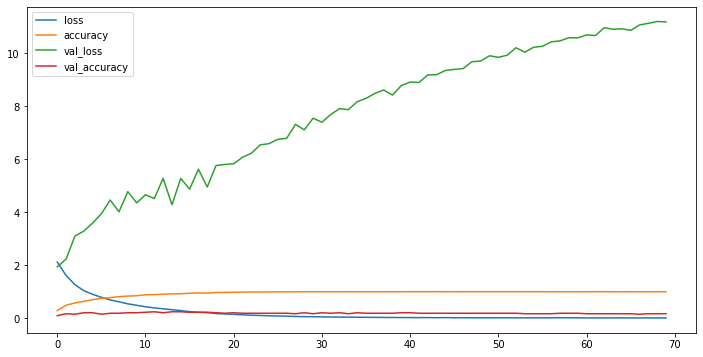

In [27]:
plotHistory(model_1_history)

In [40]:
model_2 = k.models.Sequential([
    k.layers.Dense(512, activation='relu', input_shape=(X_train.shape[1],)),
    k.layers.Dropout(0.2),
    
    k.layers.Dense(256, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(128, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(64, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(10, activation='softmax'),
])
print(model_2.summary())
model_2_history = trainModel(model=model_2, epochs=100, optimizer='adam')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 512)               29696     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_6 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 64)               

Max. Validation Accuracy 0.9444444179534912


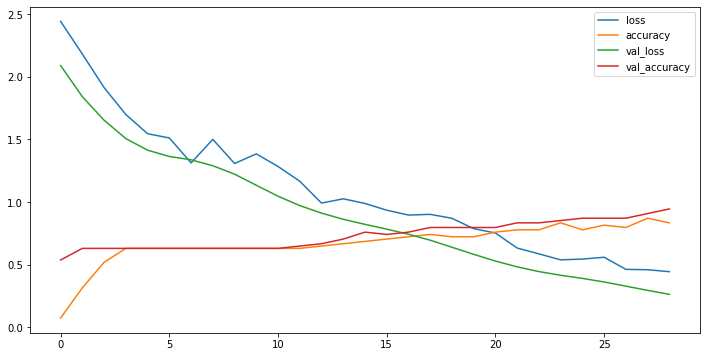

In [41]:
plotHistory(model_2_history)

In [42]:
model_3 = k.models.Sequential([
    k.layers.Dense(512, activation='relu', input_shape=(X_train.shape[1],)),
    k.layers.Dropout(0.2),
    
    k.layers.Dense(256, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(128, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(64, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(10, activation='softmax'),
])
print(model_3.summary())
model_3_history = trainModel(model=model_3, epochs=700, optimizer='sgd')

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 512)               29696     
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_10 (Dense)            (None, 256)               131328    
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_11 (Dense)            (None, 128)               32896     
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 dense_12 (Dense)            (None, 64)               

Max. Validation Accuracy 0.9444444179534912


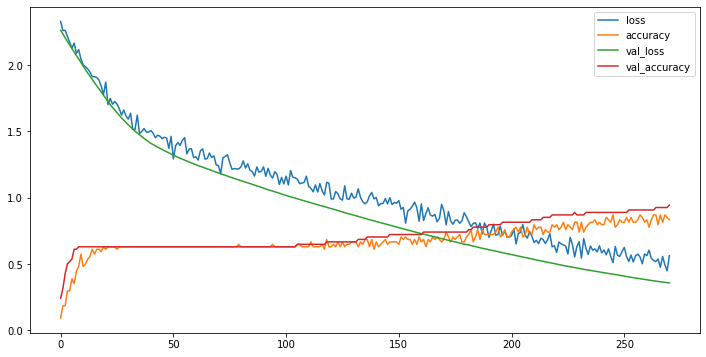

In [43]:
plotHistory(model_3_history)

In [290]:
import matplotlib.pyplot as plt
import numpy as np
import wave
import sys
import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt
import scipy
import os
import pickle
import librosa as lr
import librosa.display
from glob import glob
import IPython
from IPython.display import Audio
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import scipy.io.wavfile as wav
from tensorflow.keras import models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten
from tensorflow.keras.utils import to_categorical
from matplotlib import pyplot as plt

In [276]:
gt_data = pd.read_csv('features_3_sec.csv')
print(gt_data.shape)
gt_data.head()

(9990, 60)


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [277]:
our_data = pd.read_csv('Top50.csv')
print(our_data.shape)
our_data.head()

(54, 60)


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.000000.wav,30000.000000,0.401282,0.086966,0.133645,0.009270,2285.466215,1.526304e+06,2458.856004,481152.227178,...,73.30818,-5.018557,75.411310,3.809938,43.845936,-8.759356,43.631207,-4.040365,59.195137,blues
1,blues.000001.wav,30000.000000,0.326063,0.102756,0.148318,0.031166,1207.054377,6.459471e+05,1481.555388,709502.398726,...,69.39578,-3.525022,42.324207,-1.874528,42.235626,-7.966536,44.953590,-4.028606,67.800440,blues
2,classical.00000.wav,30013.333333,0.252361,0.084149,0.036233,0.000221,1505.357460,4.443073e+04,1559.228895,43765.373123,...,86.13082,-0.318471,100.835740,1.773055,95.493810,0.888721,97.099720,-0.835078,120.920820,classical
3,country.00000.wav,30081.632653,0.383930,0.081185,0.248296,0.000716,2798.065627,3.546250e+05,2847.541181,105655.136749,...,68.59460,0.612088,54.308323,4.062127,74.348236,0.907919,68.547610,4.093193,73.602806,country
4,disco.000000.wav,30000.000000,0.383889,0.101591,0.127326,0.008411,2739.188163,1.498203e+06,2460.869989,333219.464706,...,63.21444,-10.986168,89.658240,-2.868585,70.230286,-13.567414,63.092510,-2.138512,76.132126,disco


In [278]:
gt_data['label'] = preprocessing.LabelEncoder().fit_transform(gt_data['label'])
our_data['label'] = preprocessing.LabelEncoder().fit_transform(our_data['label'])

In [279]:
# dividing the data into train and test sets
X_gt = gt_data.drop(['label', 'filename', 'length'], axis=1)
y_gt = gt_data['label']
X_50 = our_data.drop(['label', 'filename', 'length'], axis=1)
y_50 = our_data['label']

In [282]:
#Modify training for CNN
X_gt=np.resize(X_gt, (9990,57)).reshape(999,10,57,1)
labels=[]
for i in range(9990):
    if i%10==0:
        labels.append(y_gt[i])
labels=pd.DataFrame(labels)
labels=to_categorical(labels)

In [283]:
#Modify testing for CNN
X_50=np.repeat([X_50],10)
X_50=np.resize(X_50, (30780,)).reshape(54,10,57,1)


y_50=to_categorical(y_50, num_classes = 10)

In [285]:
X_train = X_gt
y_train = labels
X_test = X_50
y_test = y_50

In [286]:
#CNN Model
model = Sequential()
#add model layers
model.add(Conv2D(256, kernel_size=3, activation='relu', input_shape=(10,57,1)))
model.add(Conv2D(64, kernel_size=3, activation='relu'))
model.add(Flatten())
model.add(Dense(10, activation='softmax'))
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 8, 55, 256)        2560      
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 6, 53, 64)         147520    
_________________________________________________________________
flatten_4 (Flatten)          (None, 20352)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 10)                203530    
Total params: 353,610
Trainable params: 353,610
Non-trainable params: 0
_________________________________________________________________


In [296]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

Train on 999 samples, validate on 54 samples
Epoch 1/500
999/999 [==============================] - 10s 10ms/sample - loss: 1.6927 - accuracy: 0.4164 - val_loss: 3.6251 - val_accuracy: 0.1481
Epoch 2/500
999/999 [==============================] - 6s 6ms/sample - loss: 1.6999 - accuracy: 0.4194 - val_loss: 3.6259 - val_accuracy: 0.1481
Epoch 3/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.6256 - accuracy: 0.4114 - val_loss: 3.8033 - val_accuracy: 0.1296
Epoch 4/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.5612 - accuracy: 0.4434 - val_loss: 3.8561 - val_accuracy: 0.1296
Epoch 5/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.5526 - accuracy: 0.4525 - val_loss: 4.1511 - val_accuracy: 0.0741
Epoch 6/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.6503 - accuracy: 0.4515 - val_loss: 4.1079 - val_accuracy: 0.1667
Epoch 7/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.5711

Epoch 57/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2558 - accuracy: 0.5445 - val_loss: 5.7163 - val_accuracy: 0.1852
Epoch 58/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2700 - accuracy: 0.5415 - val_loss: 5.6372 - val_accuracy: 0.1852
Epoch 59/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2490 - accuracy: 0.5425 - val_loss: 5.8632 - val_accuracy: 0.1852
Epoch 60/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2520 - accuracy: 0.5576 - val_loss: 5.9540 - val_accuracy: 0.1852
Epoch 61/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2508 - accuracy: 0.5606 - val_loss: 5.9913 - val_accuracy: 0.1852
Epoch 62/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2410 - accuracy: 0.5686 - val_loss: 6.2515 - val_accuracy: 0.1667
Epoch 63/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2539 - accuracy: 0.5425 - val_loss: 24.2121 

Epoch 113/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.8091 - accuracy: 0.3453 - val_loss: 54.6320 - val_accuracy: 0.0370
Epoch 114/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.8028 - accuracy: 0.3243 - val_loss: 53.4821 - val_accuracy: 0.0370
Epoch 115/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.7927 - accuracy: 0.3363 - val_loss: 51.7268 - val_accuracy: 0.0185
Epoch 116/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.8067 - accuracy: 0.3343 - val_loss: 50.4760 - val_accuracy: 0.0185
Epoch 117/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.8069 - accuracy: 0.3243 - val_loss: 49.3250 - val_accuracy: 0.0185
Epoch 118/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.7997 - accuracy: 0.3393 - val_loss: 47.6737 - val_accuracy: 0.0185
Epoch 119/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.8044 - accuracy: 0.3544 - val_l

999/999 [==============================] - 6s 6ms/sample - loss: 1.7450 - accuracy: 0.3644 - val_loss: 11.5725 - val_accuracy: 0.0370
Epoch 169/500
999/999 [==============================] - 6s 6ms/sample - loss: 1.7575 - accuracy: 0.3764 - val_loss: 11.8232 - val_accuracy: 0.0185
Epoch 170/500
999/999 [==============================] - 6s 6ms/sample - loss: 1.7381 - accuracy: 0.3574 - val_loss: 11.8549 - val_accuracy: 0.0185
Epoch 171/500
999/999 [==============================] - 6s 6ms/sample - loss: 1.7495 - accuracy: 0.3684 - val_loss: 12.7545 - val_accuracy: 0.0185
Epoch 172/500
999/999 [==============================] - 6s 6ms/sample - loss: 1.7372 - accuracy: 0.3684 - val_loss: 12.5137 - val_accuracy: 0.0185
Epoch 173/500
999/999 [==============================] - 6s 6ms/sample - loss: 1.7460 - accuracy: 0.3544 - val_loss: 12.6256 - val_accuracy: 0.0185
Epoch 174/500
999/999 [==============================] - 6s 6ms/sample - loss: 1.7230 - accuracy: 0.3544 - val_loss: 12.7714 -

999/999 [==============================] - 5s 5ms/sample - loss: 1.6213 - accuracy: 0.4214 - val_loss: 23.3367 - val_accuracy: 0.0185
Epoch 224/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.6295 - accuracy: 0.4224 - val_loss: 23.9320 - val_accuracy: 0.0185
Epoch 225/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.5915 - accuracy: 0.4054 - val_loss: 25.8812 - val_accuracy: 0.0185
Epoch 226/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.6147 - accuracy: 0.4384 - val_loss: 22.5525 - val_accuracy: 0.0185
Epoch 227/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.6315 - accuracy: 0.4004 - val_loss: 23.8979 - val_accuracy: 0.0185
Epoch 228/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.6390 - accuracy: 0.4124 - val_loss: 23.6213 - val_accuracy: 0.0185
Epoch 229/500
999/999 [==============================] - 5s 5ms/sample - loss: 2.0843 - accuracy: 0.4134 - val_loss: 22.0160 -

999/999 [==============================] - 5s 5ms/sample - loss: 1.4474 - accuracy: 0.4975 - val_loss: 25.7529 - val_accuracy: 0.0370
Epoch 279/500
999/999 [==============================] - 6s 6ms/sample - loss: 1.4344 - accuracy: 0.4895 - val_loss: 25.4964 - val_accuracy: 0.0370
Epoch 280/500
999/999 [==============================] - 6s 6ms/sample - loss: 1.4074 - accuracy: 0.5075 - val_loss: 25.7902 - val_accuracy: 0.0370
Epoch 281/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.4051 - accuracy: 0.5105 - val_loss: 25.9426 - val_accuracy: 0.0370
Epoch 282/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.4024 - accuracy: 0.5015 - val_loss: 26.7556 - val_accuracy: 0.0370
Epoch 283/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.4739 - accuracy: 0.4945 - val_loss: 23.6875 - val_accuracy: 0.0370
Epoch 284/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.4465 - accuracy: 0.5015 - val_loss: 24.2246 -

999/999 [==============================] - 5s 5ms/sample - loss: 1.3034 - accuracy: 0.5415 - val_loss: 38.5783 - val_accuracy: 0.0185
Epoch 334/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.3136 - accuracy: 0.5395 - val_loss: 37.2420 - val_accuracy: 0.0185
Epoch 335/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.3129 - accuracy: 0.5506 - val_loss: 36.0926 - val_accuracy: 0.0370
Epoch 336/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.3314 - accuracy: 0.5265 - val_loss: 38.6955 - val_accuracy: 0.0185
Epoch 337/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.4484 - accuracy: 0.4905 - val_loss: 31.7095 - val_accuracy: 0.0370
Epoch 338/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.4594 - accuracy: 0.4885 - val_loss: 32.0106 - val_accuracy: 0.0370
Epoch 339/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.4140 - accuracy: 0.5165 - val_loss: 31.7347 -

999/999 [==============================] - 5s 5ms/sample - loss: 1.2672 - accuracy: 0.5586 - val_loss: 44.3643 - val_accuracy: 0.0000e+00
Epoch 389/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.3043 - accuracy: 0.5285 - val_loss: 43.0110 - val_accuracy: 0.0000e+00
Epoch 390/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.4099 - accuracy: 0.5475 - val_loss: 43.6387 - val_accuracy: 0.0000e+00
Epoch 391/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.3046 - accuracy: 0.5506 - val_loss: 42.9179 - val_accuracy: 0.0000e+00
Epoch 392/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.3238 - accuracy: 0.5646 - val_loss: 43.3655 - val_accuracy: 0.0000e+00
Epoch 393/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2680 - accuracy: 0.5696 - val_loss: 43.2437 - val_accuracy: 0.0000e+00
Epoch 394/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2588 - accuracy: 0.54

Epoch 442/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.1909 - accuracy: 0.5856 - val_loss: 57.5993 - val_accuracy: 0.0000e+00
Epoch 443/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.1967 - accuracy: 0.5796 - val_loss: 57.9558 - val_accuracy: 0.0000e+00
Epoch 444/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2102 - accuracy: 0.5726 - val_loss: 57.8194 - val_accuracy: 0.0000e+00
Epoch 445/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.1914 - accuracy: 0.5756 - val_loss: 57.0274 - val_accuracy: 0.0000e+00
Epoch 446/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2121 - accuracy: 0.5626 - val_loss: 54.9333 - val_accuracy: 0.0000e+00
Epoch 447/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.2037 - accuracy: 0.5636 - val_loss: 54.4741 - val_accuracy: 0.0000e+00
Epoch 448/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.1977 - 

999/999 [==============================] - 5s 5ms/sample - loss: 1.1583 - accuracy: 0.5856 - val_loss: 57.9028 - val_accuracy: 0.0000e+00
Epoch 497/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.1578 - accuracy: 0.5966 - val_loss: 59.0503 - val_accuracy: 0.0000e+00
Epoch 498/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.1709 - accuracy: 0.5926 - val_loss: 59.0076 - val_accuracy: 0.0000e+00
Epoch 499/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.1598 - accuracy: 0.5956 - val_loss: 58.0076 - val_accuracy: 0.0000e+00
Epoch 500/500
999/999 [==============================] - 5s 5ms/sample - loss: 1.1599 - accuracy: 0.5896 - val_loss: 58.2480 - val_accuracy: 0.0000e+00


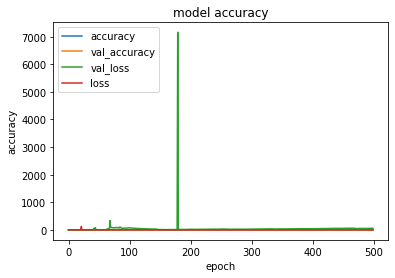

In [297]:
#train the model
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=500)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.plot(history.history['val_loss'])
plt.plot(history.history['loss'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['accuracy', 'val_accuracy', 'val_loss', 'loss'], loc='upper left')
plt.show()


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import wave
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
import os
import pickle
import librosa as lr
import librosa.display
from glob import glob
import IPython
from IPython.display import Audio
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
import scipy.io.wavfile as wav
from python_speech_features import mfcc, logfbank

2022-08-11 10:33:25.793972: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-08-11 10:33:25.794010: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [3]:
data = []
sample_rate = 22050

for audio_name in glob(r'Top_50_songs/**/*.wav', recursive=True):
  audio, sr = librosa.load(audio_name, sr=sample_rate)
  data.append(audio)
print(type(audio))

<class 'numpy.ndarray'>


In [4]:
len(data) # extra songs added later to make up for empty genre directories

56

In [5]:
# playing the audios

IPython.display.Audio(data[0], rate=sample_rate)

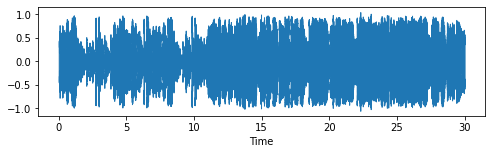

In [7]:
# plotting the raw wave files

plt.figure(figsize=(8,2))
librosa.display.waveshow(data[0])
plt.show()

In [11]:
data_mfcc = []
sample_rate = 22050

for audio_name in glob(r'Top_50_songs/**/*.wav', recursive=True):
  audio, sr = librosa.load(audio_name, sr=sample_rate)
  mfcc = librosa.feature.mfcc(y=audio, sr=sample_rate)
  data_mfcc.append(mfcc)
print(type(mfcc))


<class 'numpy.ndarray'>


In [15]:
mfcc.shape

(20, 8881)

In [16]:
np.shape(data_mfcc)

ValueError: could not broadcast input array from shape (20,1292) into shape (20,)

In [73]:
df = pd.DataFrame(data_mfcc)



ValueError: ignored

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import wave
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
import os
import pickle
import librosa as lr
import librosa.display
from glob import glob
import IPython
from IPython.display import Audio
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
import scipy.io.wavfile as wav
from python_speech_features import mfcc, logfbank

2022-08-11 10:48:11.517479: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-08-11 10:48:11.517513: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [3]:
# Read the input audio file
for f in glob(r'Top_50_songs/**/*.wav', recursive=True):
     (rate,sig) = wav.read(f)
     # Rest of your code

In [4]:
# Take the first 10 samples for analysis
sig = sig[:50]
features_mfcc = mfcc(sig,rate)

In [5]:
# Print the parameters for MFCC
print('\nMFCC:\nNumber of windows =', features_mfcc.shape[0])
print('Length of each feature =', features_mfcc.shape[1])


MFCC:
Number of windows = 1
Length of each feature = 13


Text(0.5, 1.0, 'MFCC')

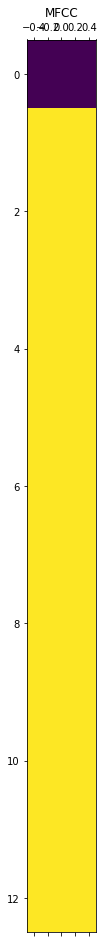

In [6]:
# Plot the features
features_mfcc = features_mfcc.T
plt.matshow(features_mfcc)
plt.title('MFCC')

In [7]:
# Extract the Filter Bank features
features_fb = logfbank(sig, rate)

In [8]:
# Print the parameters for Filter Bank 
print('\nFilter bank:\nNumber of windows =', features_fb.shape[0])
print('Length of each feature =', features_fb.shape[1])


Filter bank:
Number of windows = 1
Length of each feature = 26


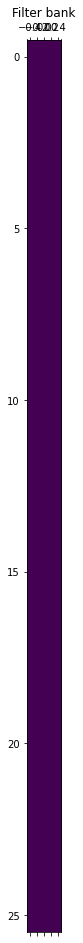

In [9]:
# Plot the features
features_fb = features_fb.T
plt.matshow(features_fb)
plt.title('Filter bank')

plt.show()

In [17]:
audio_data, sr = glob(r'Top_50_songs/Data/genres_original/blues/blues.000000.wav')
audio, _ = librosa.effects.trim(audio_data)
print('audio_data size :', audio_data.shape[0])
print('Sample Rate :', sr)
print('audio file len :', audio_data.shape[0]/sr)

ValueError: not enough values to unpack (expected 2, got 1)

In [16]:
IPython.display.Audio(r'Top_50_songs/Data/genres_original/blues/blues.000000.wav', rate= sr)